In [299]:
from google.cloud import vision
from google.oauth2 import service_account
import os
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib.image import imread
import io
import pandas as pd
import spacy
nlp = spacy.load("en_core_web_md")
import math

/opt/venv/lib/python3.7/site-packages/spacy/util.py:275: UserWarning: [W031] Model 'en_core_web_md' (2.2.0) requires spaCy v2.2 and is incompatible with the current spaCy version (2.3.4). This may lead to unexpected results or runtime errors. To resolve this, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)


Dalším kontrolním bodem je schopnost přihlásit se k vašemu účtu z Python, k tomu slouží následující příkazy. Je potřeba začít s tím, aby jste již vygenerovaný soubor s přihlašovacími údaji zpřístupnili pythony:

In [302]:
creds = service_account.Credentials.from_service_account_file('./credentials.json')
client = vision.ImageAnnotatorClient(credentials=creds)

In [303]:
def get_labels(image):
    with io.open(image, 'rb') as image_file:
        content = image_file.read()
    image = vision.Image(content = content)
    labels = client.label_detection(image=image).label_annotations
    return labels

get all images

In [305]:
path = './data/'
labels_images = {}
for dir in os.listdir(path):
    if dir.startswith('tym'):
        p = os.path.join(path, dir)
        for image in os.listdir(p):
            im_path = os.path.join(p, image)
            lbls = get_labels(im_path)
            lbl_set = [i.description for i in lbls]
            labels_images[im_path] = lbl_set   

In [306]:
tags = {}
for k, v in labels_images.items():
    for j in v:
        pocet = tags.get(j, [0, []])[0] + 1
        seznam = tags.get(j, [0, []])[1]
        seznam.append(k)
        tags[j] = [pocet, seznam]

In [307]:
sort_tabs = sorted(tags.items(), key = lambda x: x[1], reverse = True)

In [308]:
sort_tabs

[('Highland',
  [44,
   ['./data/tym8/136402.jpg',
    './data/tym8/136601.jpg',
    './data/tym13/114201.jpg',
    './data/tym13/114300.jpg',
    './data/tym13/111700.jpg',
    './data/tym13/112301.jpg',
    './data/tym13/112402.jpg',
    './data/tym13/112406.jpg',
    './data/tym13/117300.jpg',
    './data/tym2/137802.jpg',
    './data/tym2/139801.jpg',
    './data/tym2/120101.jpg',
    './data/tym14/148501.jpg',
    './data/tym14/100503.jpg',
    './data/tym14/100301.jpg',
    './data/tym14/100002.jpg',
    './data/tym5/117301.jpg',
    './data/tym1/112406.jpg',
    './data/tym1/112402.jpg',
    './data/tym1/112301.jpg',
    './data/tym1/114201.jpg',
    './data/tym10/100501.jpg',
    './data/tym10/100300.jpg',
    './data/tym6/148501.jpg',
    './data/tym6/111401.jpg',
    './data/tym4/100000.jpg',
    './data/tym4/111700.jpg',
    './data/tym4/114300.jpg',
    './data/tym4/117300.jpg',
    './data/tym3/136600.jpg',
    './data/tym3/102400.jpg',
    './data/tym12/101504.jpg',
    '

In [309]:
annotations = pd.DataFrame(columns=['tag', 'image'])
for tab in sort_tabs:
    tag_name = tab[0]
    for image in tab[1][1]:
        annotations = annotations.append({'tag': tag_name, 'image': image}, ignore_index=True)
unique_ann = pd.Series(annotations['tag'].unique())

In [310]:
ann_docs = unique_ann.apply(nlp)

In [317]:
def search_images(text, min_similarity=0.6):
    search_text = nlp(text)
    result = pd.DataFrame()
    for doc in ann_docs:
        result = result.append({'tag': str(doc), 'similarity': search_text.similarity(doc)}, ignore_index=True)
    top_annotations = result.sort_values('similarity', ascending=False).reset_index(drop=True)
    top_annotations = top_annotations[top_annotations['similarity'] > min_similarity]
    print(top_annotations)

    max_images = 30
    n_per_line = 4

    images = annotations[annotations['tag'].isin(top_annotations['tag'])]
    images = images.merge(top_annotations)
    images = images.sort_values('similarity',ascending=False)
    images = images.drop_duplicates(subset=['image'])

    images = images['image'][:max_images]
    
    f, ax = plt.subplots(int(len(images)/4), n_per_line, figsize = (50, 50))
    print(f'{search_text} - ({len(images)} images)')

    for i,image in enumerate(images):
        row = math.floor(i/n_per_line) - 1
        column = i % n_per_line
        ax[row][column].imshow(imread(image))
        ax[row][column].axis('off')

    plt.show()

/opt/venv/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: [W008] Evaluating Doc.similarity based on empty vectors.
  """
   similarity             tag
0    0.769947  Sport climbing
1    0.693001     Water sport
2    0.609879  Mountain range
Hiking is my favourite sport - (30 images)


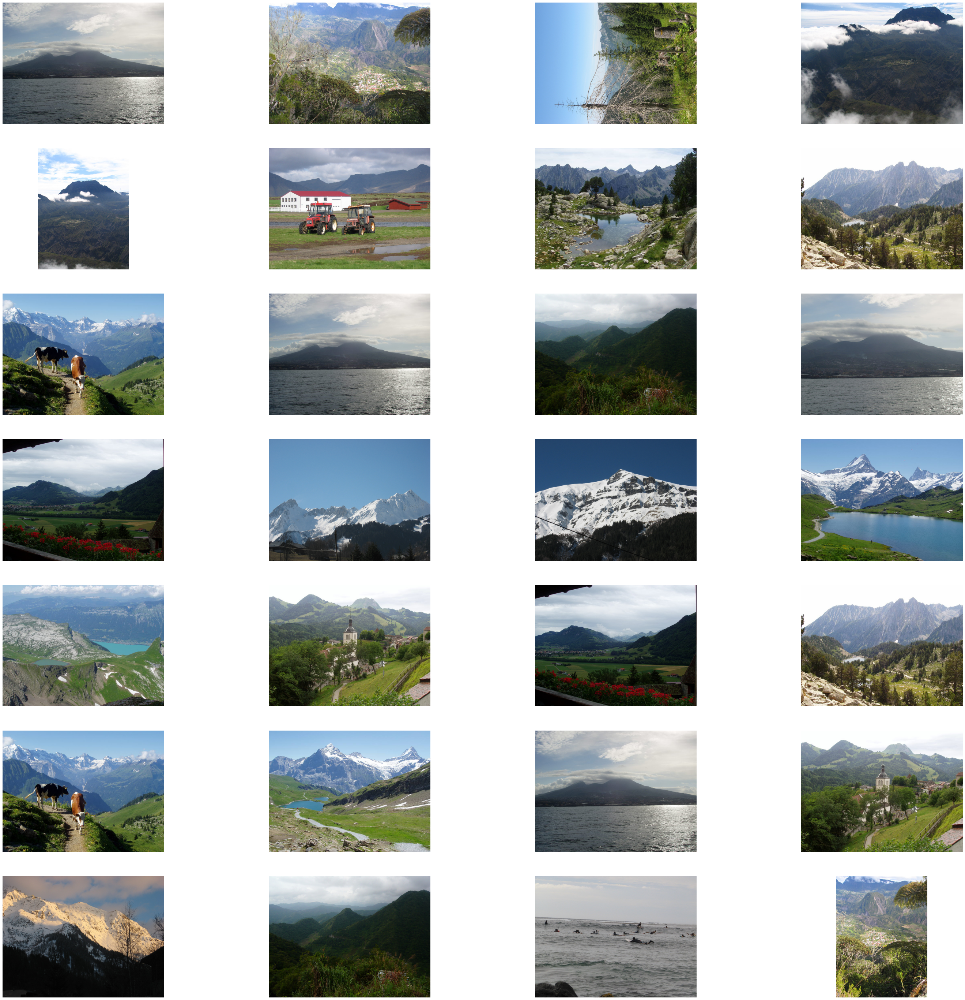

In [318]:
search_images('Hiking is my favourite sport')

/opt/venv/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: [W008] Evaluating Doc.similarity based on empty vectors.
  """
    similarity                            tag
0     0.694514                           Reef
1     0.694514                          Ocean
2     0.679751                     Coral reef
3     0.647259             Red sky at morning
4     0.645166  Coastal and oceanic landforms
5     0.641568                            Sea
6     0.636826              Natural landscape
7     0.621733                       Land lot
8     0.621436                    Stony coral
9     0.606047                  Body of water
10    0.600469                          Beach
11    0.600469                         Marina
12    0.600045                 Mountain range
Ocean is my favourite scenery - (30 images)


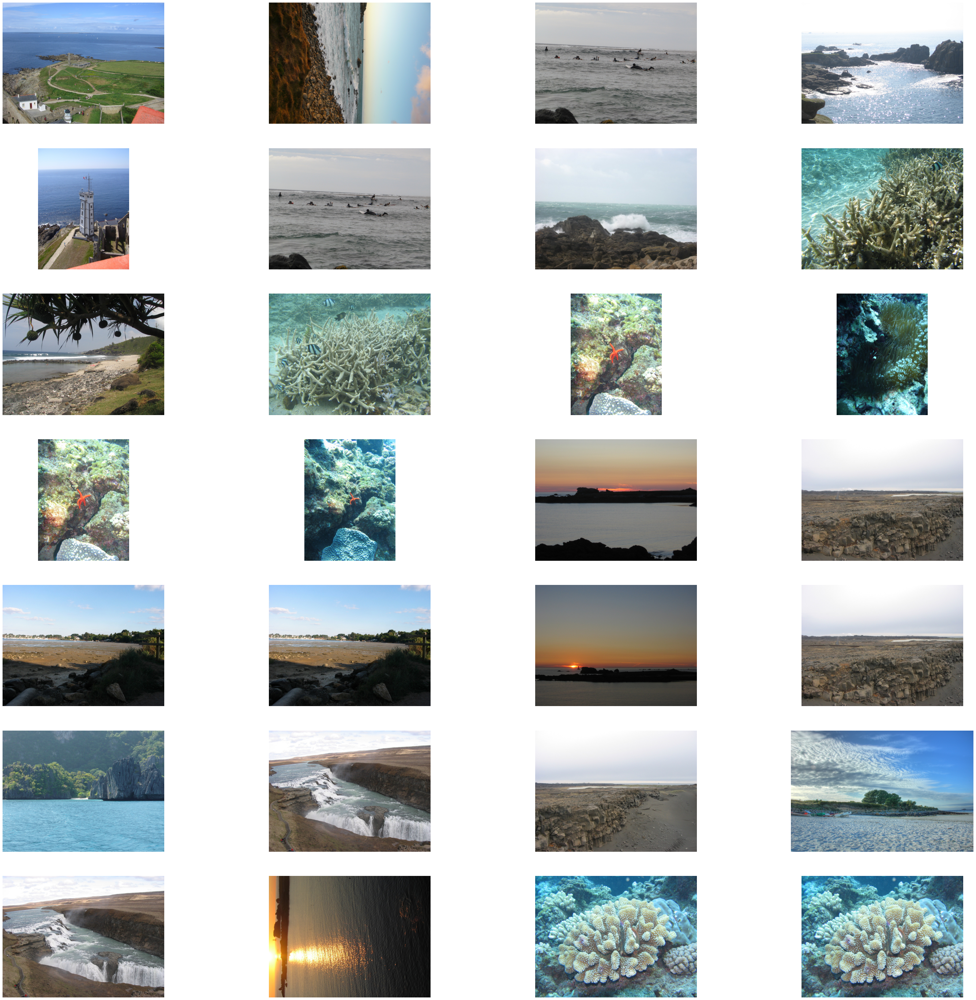

In [319]:
search_images('Ocean is my favourite scenery')